<a href="https://colab.research.google.com/github/ameenattar92/Fake-news-classifiaction/blob/main/Fake_News_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##**About the Dataset:**

1.**ID:** unique id for a news article

2.**TITLE:** the title of a news article

3.**AUTHOR:** author of the news article

4.**TEXT:** the text of the article; could be incomplete

5.**LABEL:** a label that marks whether the news article is real or fake:
    
    1: Fake news
    
    0: real News

#IMPORTING REQUIRED LIBRARIES


In [ ]:
#Importing all the required libraries

import numpy as np
import pandas as pd
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import matplotlib
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.neural_network import MLPClassifier
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
# import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [ ]:
#Installing nltk library

!pip install nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#importing nltk library

import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# printing the stopwords in English
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

#Text preprocessing

In [ ]:
#mounting drive on google colab

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# loading the dataset to a pandas DataFrame
elections_dataset = pd.read_csv('/content/drive/MyDrive/Dissertation/US Elections Data Set/train.csv')

In [ ]:
#Checking the shape of the dataset

elections_dataset.shape

(20800, 5)

In [ ]:
#checking first five observations

elections_dataset.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [ ]:
#Checking last five observations

elections_dataset.tail()

,id,title,author,text,label
20795,20795,Rapper T.I.: Trump a ’Poster Child For White S...,Jerome Hudson,Rapper T. I. unloaded on black celebrities who...,0
20796,20796,"N.F.L. Playoffs: Schedule, Matchups and Odds -...",Benjamin Hoffman,When the Green Bay Packers lost to the Washing...,0
20797,20797,Macy’s Is Said to Receive Takeover Approach by...,Michael J. de la Merced and Rachel Abrams,The Macy’s of today grew from the union of sev...,0
20798,20798,"NATO, Russia To Hold Parallel Exercises In Bal...",Alex Ansary,"NATO, Russia To Hold Parallel Exercises In Bal...",1
20799,20799,What Keeps the F-35 Alive,David Swanson,"David Swanson is an author, activist, journa...",1


In [ ]:
# counting the number of missing values in the dataset
elections_dataset.isnull().sum()

id           0
title      558
author    1957
text        39
label        0
dtype: int64

In [ ]:
# replacing the null values with empty string
elections_dataset = elections_dataset.fillna('')

In [ ]:
# checking the number of missing values in the dataset
elections_dataset.isnull().sum()

id        0
title     0
author    0
text      0
label     0
dtype: int64

In [ ]:
#checking first 10 observations

elections_dataset.head(10)

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1
5,5,Jackie Mason: Hollywood Would Love Trump if He...,Daniel Nussbaum,"In these trying times, Jackie Mason is the Voi...",0
6,6,Life: Life Of Luxury: Elton John’s 6 Favorite ...,,Ever wonder how Britain’s most iconic pop pian...,1
7,7,Benoît Hamon Wins French Socialist Party’s Pre...,Alissa J. Rubin,"PARIS — France chose an idealistic, traditi...",0
8,8,Excerpts From a Draft Script for Donald Trump’...,,Donald J. Trump is scheduled to make a highly ...,0
9,9,"A Back-Channel Plan for Ukraine and Russia, Co...",Megan Twohey and Scott Shane,A week before Michael T. Flynn resigned as nat...,0


In [ ]:
#checking the value for given index location

elections_dataset.iloc[0]['text']

'House Dem Aide: We Didn’t Even See Comey’s Letter Until Jason Chaffetz Tweeted It By Darrell Lucus on October 30, 2016 Subscribe Jason Chaffetz on the stump in American Fork, Utah ( image courtesy Michael Jolley, available under a Creative Commons-BY license) \nWith apologies to Keith Olbermann, there is no doubt who the Worst Person in The World is this week–FBI Director James Comey. But according to a House Democratic aide, it looks like we also know who the second-worst person is as well. It turns out that when Comey sent his now-infamous letter announcing that the FBI was looking into emails that may be related to Hillary Clinton’s email server, the ranking Democrats on the relevant committees didn’t hear about it from Comey. They found out via a tweet from one of the Republican committee chairmen. \nAs we now know, Comey notified the Republican chairmen and Democratic ranking members of the House Intelligence, Judiciary, and Oversight committees that his agency was reviewing emai

In [ ]:
#getting the details of author column

elections_dataset['author']

0                                    Darrell Lucus
1                                  Daniel J. Flynn
2                               Consortiumnews.com
3                                  Jessica Purkiss
4                                   Howard Portnoy
                           ...                    
20795                                Jerome Hudson
20796                             Benjamin Hoffman
20797    Michael J. de la Merced and Rachel Abrams
20798                                  Alex Ansary
20799                                David Swanson
Name: author, Length: 20800, dtype: object

In [ ]:
#getting the details of title column

elections_dataset['title']

0        House Dem Aide: We Didn’t Even See Comey’s Let...
1        FLYNN: Hillary Clinton, Big Woman on Campus - ...
2                        Why the Truth Might Get You Fired
3        15 Civilians Killed In Single US Airstrike Hav...
4        Iranian woman jailed for fictional unpublished...
                               ...                        
20795    Rapper T.I.: Trump a ’Poster Child For White S...
20796    N.F.L. Playoffs: Schedule, Matchups and Odds -...
20797    Macy’s Is Said to Receive Takeover Approach by...
20798    NATO, Russia To Hold Parallel Exercises In Bal...
20799                            What Keeps the F-35 Alive
Name: title, Length: 20800, dtype: object

In [ ]:
# merging the author name and news title
elections_dataset['content'] = elections_dataset['author']+' '+elections_dataset['title']

In [ ]:
#printing the content column

print(elections_dataset['content'])

0        Darrell Lucus House Dem Aide: We Didn’t Even S...
1        Daniel J. Flynn FLYNN: Hillary Clinton, Big Wo...
2        Consortiumnews.com Why the Truth Might Get You...
3        Jessica Purkiss 15 Civilians Killed In Single ...
4        Howard Portnoy Iranian woman jailed for fictio...
                               ...                        
20795    Jerome Hudson Rapper T.I.: Trump a ’Poster Chi...
20796    Benjamin Hoffman N.F.L. Playoffs: Schedule, Ma...
20797    Michael J. de la Merced and Rachel Abrams Macy...
20798    Alex Ansary NATO, Russia To Hold Parallel Exer...
20799              David Swanson What Keeps the F-35 Alive
Name: content, Length: 20800, dtype: object


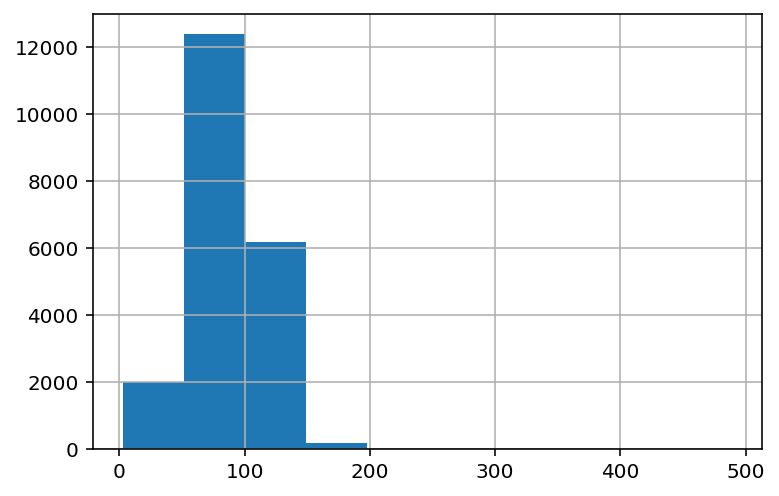

In [ ]:
#Plotting number of characters present in each sentence
elections_dataset['content'].str.len().hist()

In [ ]:
#assigning a variable 

words = elections_dataset['content']

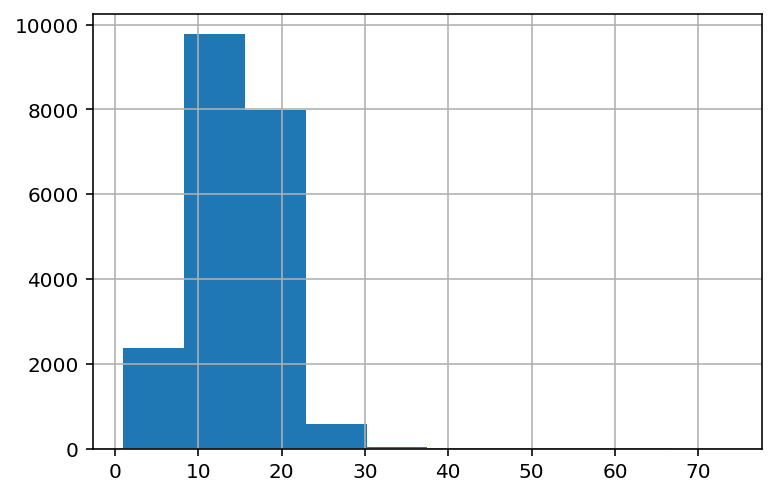

In [ ]:
#Plotting no of words present in each news article

words.str.split().\
    map(lambda x: len(x)).\
    hist()

In [ ]:
#Creating a corpus

corpus=[]
text= elections_dataset['content'].str.split()
text=text.values.tolist()
corpus=[word for i in text for word in i]

In [ ]:
#importing some more libraries

from nltk.corpus import stopwords
from collections import  Counter
import seaborn as sns

#Function for plotting most frequently occuring words

def plot_frequent_words(text):
    stop=set(stopwords.words('english'))
    
    corpus=[]
    text= elections_dataset['content'].str.split()
    text=text.values.tolist()
    corpus=[word for i in text for word in i]

    counter=Counter(corpus)
    most=counter.most_common()

    x, y= [], []
    for word,count in most[:30]:
      if (word not in stop):
          x.append(word)
          y.append(count)
          
    sns.barplot(x=y,y=x)

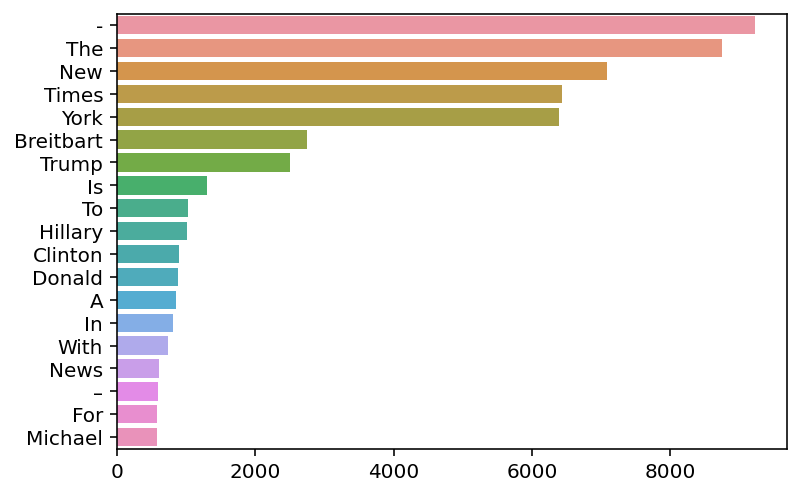

In [ ]:
#plotting the graph for frequently occurring words

plot_frequent_words(elections_dataset['content'])

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


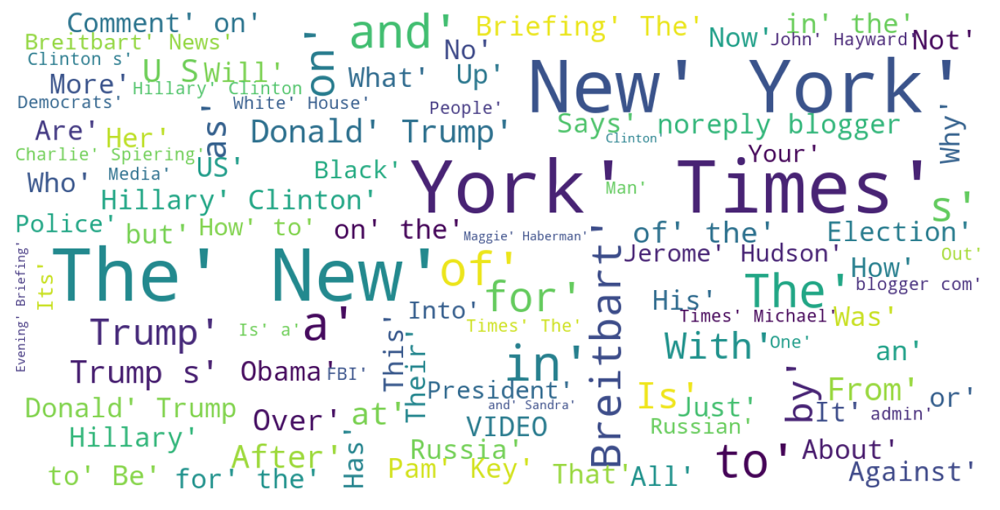

In [ ]:
#Plotting a wordcloud 

!pip install wordcloud
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

def show_wordcloud(data):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=100,
        max_font_size=30,
        scale=3,
        random_state=1)
   
    wordcloud=wordcloud.generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')

    plt.imshow(wordcloud)
    plt.show()

show_wordcloud(corpus)

label
0    10387
1    10413
Name: content, dtype: int64


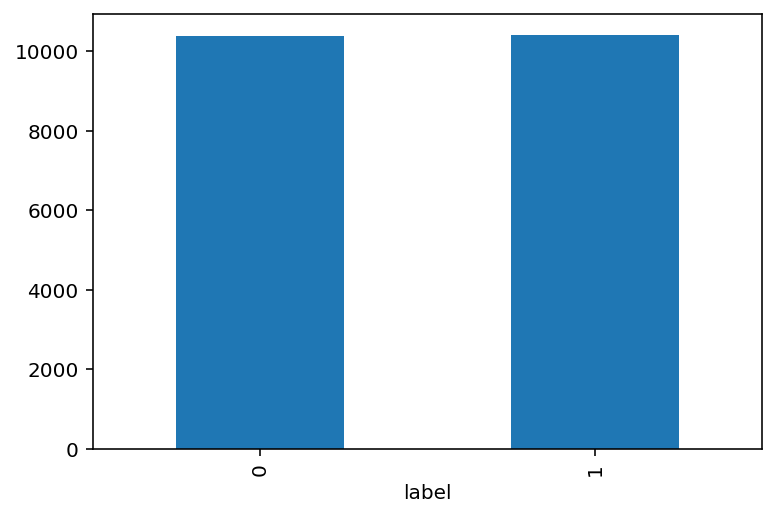

In [ ]:
# Exploring number of fake and real articles
print(elections_dataset.groupby(['label'])['content'].count())
elections_dataset.groupby(['label'])['content'].count().plot(kind="bar")
plt.show()

In [ ]:
#checking first five observations

elections_dataset.head()

,id,title,author,text,label,content
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1,Darrell Lucus House Dem Aide: We Didn’t Even S...
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0,"Daniel J. Flynn FLYNN: Hillary Clinton, Big Wo..."
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1,Consortiumnews.com Why the Truth Might Get You...
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1,Jessica Purkiss 15 Civilians Killed In Single ...
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1,Howard Portnoy Iranian woman jailed for fictio...


In [ ]:
#Dropping the columns which are of less importance

elections_dataset = elections_dataset.drop('title', axis=1)
elections_dataset = elections_dataset.drop('id', axis=1)
elections_dataset = elections_dataset.drop('author', axis=1)
elections_dataset = elections_dataset.drop('text', axis=1)

In [ ]:
#checking first five observations

elections_dataset.head()

,label,content
0,1,Darrell Lucus House Dem Aide: We Didn’t Even S...
1,0,"Daniel J. Flynn FLYNN: Hillary Clinton, Big Wo..."
2,1,Consortiumnews.com Why the Truth Might Get You...
3,1,Jessica Purkiss 15 Civilians Killed In Single ...
4,1,Howard Portnoy Iranian woman jailed for fictio...


In [ ]:
# separating the data & label
X = elections_dataset.drop(columns='label', axis=1)
Y = elections_dataset['label']

In [ ]:
#printing variable X

print(X)

                                                 content
0      Darrell Lucus House Dem Aide: We Didn’t Even S...
1      Daniel J. Flynn FLYNN: Hillary Clinton, Big Wo...
2      Consortiumnews.com Why the Truth Might Get You...
3      Jessica Purkiss 15 Civilians Killed In Single ...
4      Howard Portnoy Iranian woman jailed for fictio...
...                                                  ...
20795  Jerome Hudson Rapper T.I.: Trump a ’Poster Chi...
20796  Benjamin Hoffman N.F.L. Playoffs: Schedule, Ma...
20797  Michael J. de la Merced and Rachel Abrams Macy...
20798  Alex Ansary NATO, Russia To Hold Parallel Exer...
20799            David Swanson What Keeps the F-35 Alive

[20800 rows x 1 columns]


In [ ]:
#printing variable Y

print(Y)

0        1
1        0
2        1
3        1
4        1
        ..
20795    0
20796    0
20797    0
20798    1
20799    1
Name: label, Length: 20800, dtype: int64


In [ ]:
#resetting the index

elections_dataset.reset_index(inplace=True)

In [ ]:
#checking first five observations

elections_dataset.head()

,index,label,content
0,0,1,Darrell Lucus House Dem Aide: We Didn’t Even S...
1,1,0,"Daniel J. Flynn FLYNN: Hillary Clinton, Big Wo..."
2,2,1,Consortiumnews.com Why the Truth Might Get You...
3,3,1,Jessica Purkiss 15 Civilians Killed In Single ...
4,4,1,Howard Portnoy Iranian woman jailed for fictio...


## **Funtion to remove punctuation**


In [ ]:
#function to remove punctuation

def remove_punctuation(content):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, 
    # which in effect deletes the punctuation marks 
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return content.translate(translator)

## **Apply the function to each corpus**

In [ ]:
#applying the above function to the content column

elections_dataset['content'] = elections_dataset['content'].apply(remove_punctuation)
elections_dataset.head(10)

,index,label,content
0,0,1,Darrell Lucus House Dem Aide We Didn’t Even Se...
1,1,0,Daniel J Flynn FLYNN Hillary Clinton Big Woman...
2,2,1,Consortiumnewscom Why the Truth Might Get You ...
3,3,1,Jessica Purkiss 15 Civilians Killed In Single ...
4,4,1,Howard Portnoy Iranian woman jailed for fictio...
5,5,0,Daniel Nussbaum Jackie Mason Hollywood Would L...
6,6,1,Life Life Of Luxury Elton John’s 6 Favorite S...
7,7,0,Alissa J Rubin Benoît Hamon Wins French Social...
8,8,0,Excerpts From a Draft Script for Donald Trump...
9,9,0,Megan Twohey and Scott Shane A BackChannel Pla...


## **Removing stopwords**

In [ ]:
#function to remove stopwords

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

elections_dataset['content'] = elections_dataset['content'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
#printing the length of the stopwords

print("Number of stopwords: ", len(stop_words))

Number of stopwords:  179


##  **Lemmatization operation**

**A funtion to carry out lemmatization operation**

In [ ]:
#importing lemmatizer from nltk

nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer


[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
#importing lemmatizer from nltk

import nltk
nltk.download('omw-1.4')


[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
# creating a lemmatizer function
lemmatizer=WordNetLemmatizer()

def lemmatization(text):    
    '''a function which lemmatize each word in the given corpus/Text'''
    text = [lemmatizer.lemmatize(word) for word in text.split()]
    return " ".join(text)

**Apply the function to each corpus**

In [ ]:
#applying lemmatizer function to content column

elections_dataset['content'] = elections_dataset['content'].apply(lemmatization)
elections_dataset.head(10)

,index,label,content
0,0,1,Darrell Lucus House Dem Aide We Didn’t Even Se...
1,1,0,Daniel J Flynn FLYNN Hillary Clinton Big Woman...
2,2,1,Consortiumnewscom Why Truth Might Get You Fired
3,3,1,Jessica Purkiss 15 Civilians Killed In Single ...
4,4,1,Howard Portnoy Iranian woman jailed fictional ...
5,5,0,Daniel Nussbaum Jackie Mason Hollywood Would L...
6,6,1,Life Life Of Luxury Elton John’s 6 Favorite Sh...
7,7,0,Alissa J Rubin Benoît Hamon Wins French Social...
8,8,0,Excerpts From Draft Script Donald Trump’s Qamp...
9,9,0,Megan Twohey Scott Shane A BackChannel Plan Uk...


## **Text length of each sentence**

In [ ]:
#function to check length of a sentencce

def length(text):    
    '''a function which returns the length of the text'''
    return len(text)

A function to return the length of text

In [ ]:
#applying above function to the content column

elections_dataset['length'] = elections_dataset['content'].apply(length)
elections_dataset.head(10)

,index,label,content,length
0,0,1,Darrell Lucus House Dem Aide We Didn’t Even Se...,94
1,1,0,Daniel J Flynn FLYNN Hillary Clinton Big Woman...,63
2,2,1,Consortiumnewscom Why Truth Might Get You Fired,47
3,3,1,Jessica Purkiss 15 Civilians Killed In Single ...,79
4,4,1,Howard Portnoy Iranian woman jailed fictional ...,91
5,5,0,Daniel Nussbaum Jackie Mason Hollywood Would L...,124
6,6,1,Life Life Of Luxury Elton John’s 6 Favorite Sh...,107
7,7,0,Alissa J Rubin Benoît Hamon Wins French Social...,100
8,8,0,Excerpts From Draft Script Donald Trump’s Qamp...,93
9,9,0,Megan Twohey Scott Shane A BackChannel Plan Uk...,103


In [ ]:
#separating the data and label
X = elections_dataset['content']
Y = elections_dataset['label']

In [ ]:
print(X)

0        Darrell Lucus House Dem Aide We Didn’t Even Se...
1        Daniel J Flynn FLYNN Hillary Clinton Big Woman...
2          Consortiumnewscom Why Truth Might Get You Fired
3        Jessica Purkiss 15 Civilians Killed In Single ...
4        Howard Portnoy Iranian woman jailed fictional ...
                               ...                        
20795    Jerome Hudson Rapper TI Trump ’Poster Child Fo...
20796    Benjamin Hoffman NFL Playoffs Schedule Matchup...
20797    Michael J de la Merced Rachel Abrams Macy’s Is...
20798    Alex Ansary NATO Russia To Hold Parallel Exerc...
20799                   David Swanson What Keeps F35 Alive
Name: content, Length: 20800, dtype: object


In [ ]:
print(Y)

0        1
1        0
2        1
3        1
4        1
        ..
20795    0
20796    0
20797    0
20798    1
20799    1
Name: label, Length: 20800, dtype: int64


In [ ]:
Y.shape

(20800,)

##Tokenization

In [ ]:
#Importing and downloading the NLTK library

import nltk
nltk.download()

NLTK Downloader
---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> d

Download which package (l=list; x=cancel)?
  Identifier> l
Packages:
  [ ] abc................. Australian Broadcasting Commission 2006
  [ ] alpino.............. Alpino Dutch Treebank
  [ ] averaged_perceptron_tagger Averaged Perceptron Tagger
  [ ] averaged_perceptron_tagger_ru Averaged Perceptron Tagger (Russian)
  [ ] basque_grammars..... Grammars for Basque
  [ ] biocreative_ppi..... BioCreAtIvE (Critical Assessment of Information
                           Extraction Systems in Biology)
  [ ] bllip_wsj_no_aux.... BLLIP Parser: WSJ Model
  [ ] book_grammars....... Grammars from NLTK Book
  [ ] brown............... Brown Corpus
  [ ] brown_tei........... Brown Corpus (TEI XML Version)
  [ ] cess_cat............ CESS-CAT Treebank
  [

True

In [ ]:
#Importing the libraries required for Tokenization

from nltk import tokenize
import nltk
nltk.download('punkt')
from nltk.tokenize import RegexpTokenizer
tokenizer = RegexpTokenizer


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
#importing the tokenizer

from nltk.tokenize import sent_tokenize, word_tokenize

In [ ]:
#Creating a function for the tokenizer operation

import re 

def tokenize(text):

    tokens = re.split('\W+', text)
    return tokens

In [ ]:
#applying the tokenizer function to the content column

elections_dataset['tokenized'] = elections_dataset['content'].apply(lambda x: tokenize(x.lower()))
elections_dataset.head(5)

,index,label,content,length,tokenized
0,0,1,Darrell Lucus House Dem Aide We Didn’t Even Se...,94,"[darrell, lucus, house, dem, aide, we, didn, t..."
1,1,0,Daniel J Flynn FLYNN Hillary Clinton Big Woman...,63,"[daniel, j, flynn, flynn, hillary, clinton, bi..."
2,2,1,Consortiumnewscom Why Truth Might Get You Fired,47,"[consortiumnewscom, why, truth, might, get, yo..."
3,3,1,Jessica Purkiss 15 Civilians Killed In Single ...,79,"[jessica, purkiss, 15, civilians, killed, in, ..."
4,4,1,Howard Portnoy Iranian woman jailed fictional ...,91,"[howard, portnoy, iranian, woman, jailed, fict..."


In [ ]:
#dropping a column

elections_dataset = elections_dataset.drop('content', axis=1)

In [ ]:
elections_dataset.head()

,index,label,length,tokenized
0,0,1,94,"[darrell, lucus, house, dem, aide, we, didn, t..."
1,1,0,63,"[daniel, j, flynn, flynn, hillary, clinton, bi..."
2,2,1,47,"[consortiumnewscom, why, truth, might, get, yo..."
3,3,1,79,"[jessica, purkiss, 15, civilians, killed, in, ..."
4,4,1,91,"[howard, portnoy, iranian, woman, jailed, fict..."


In [ ]:
#renaming the column name

elections_dataset.rename(columns = {'tokenized':'content'}, inplace = True)

In [ ]:
elections_dataset.head()

,index,label,length,content
0,0,1,94,"[darrell, lucus, house, dem, aide, we, didn, t..."
1,1,0,63,"[daniel, j, flynn, flynn, hillary, clinton, bi..."
2,2,1,47,"[consortiumnewscom, why, truth, might, get, yo..."
3,3,1,79,"[jessica, purkiss, 15, civilians, killed, in, ..."
4,4,1,91,"[howard, portnoy, iranian, woman, jailed, fict..."


In [ ]:
print(elections_dataset['content'])

0        [darrell, lucus, house, dem, aide, we, didn, t...
1        [daniel, j, flynn, flynn, hillary, clinton, bi...
2        [consortiumnewscom, why, truth, might, get, yo...
3        [jessica, purkiss, 15, civilians, killed, in, ...
4        [howard, portnoy, iranian, woman, jailed, fict...
                               ...                        
20795    [jerome, hudson, rapper, ti, trump, poster, ch...
20796    [benjamin, hoffman, nfl, playoffs, schedule, m...
20797    [michael, j, de, la, merced, rachel, abrams, m...
20798    [alex, ansary, nato, russia, to, hold, paralle...
20799            [david, swanson, what, keeps, f35, alive]
Name: content, Length: 20800, dtype: object


**Splitting the dataset to training & test data**

In [ ]:
#splitting the data into training and validation set

X_train, test_X, Y_train, test_Y = train_test_split(X, Y, test_size = 0.2, stratify=Y, random_state=2)

**TF-IDF Vectorizer**

In [ ]:
# converting the textual data to numerical data
vectorizer = TfidfVectorizer()
vectorizer.fit(X_train)

#fitting to train and test

X_train = vectorizer.transform(X_train)
X_test = vectorizer.transform(test_X)

X_train, X_test = X_train.toarray(), X_test.toarray()

X_train.shape, X_test.shape

((16640, 23764), (4160, 23764))

##Model Building

**Logistic Regression**

In [ ]:
#importing logistic regression

from sklearn.linear_model import LogisticRegression
import sklearn

In [ ]:
#applying hyperparameters

lr_model = sklearn.linear_model.LogisticRegression(penalty="l2", C=0.1)
lr_model.fit(X_train, Y_train)

LogisticRegression(C=0.1)

In [ ]:
# Get the model coefficients

lr_model.coef_

array([[0.00999656, 0.0341206 , 0.01119828, ..., 0.03140339, 0.05358718,
        0.02194454]])

In [ ]:
# Get the predicted probabilities
train_preds = lr_model.predict(X_train)
test_preds = lr_model.predict(X_test)

In [ ]:
# Get the accuracy scores
train_accuracy = accuracy_score(train_preds,Y_train)
test_accuracy = accuracy_score(test_preds,test_Y)

print("The accuracy on train data is ", train_accuracy)
print("The accuracy on test data is ", test_accuracy)

The accuracy on train data is  0.9362980769230769
The accuracy on test data is  0.9362980769230769


In [ ]:
#installing shap

pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 14.6 MB/s 


In [ ]:
#importing shap libaray

import shap
shap.initjs()

In [ ]:
#code for shap explainer in order to get the shap values

explainer = shap.Explainer(lr_model, X_train, feature_names=vectorizer.get_feature_names())
shap_values = explainer(X_test)

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.


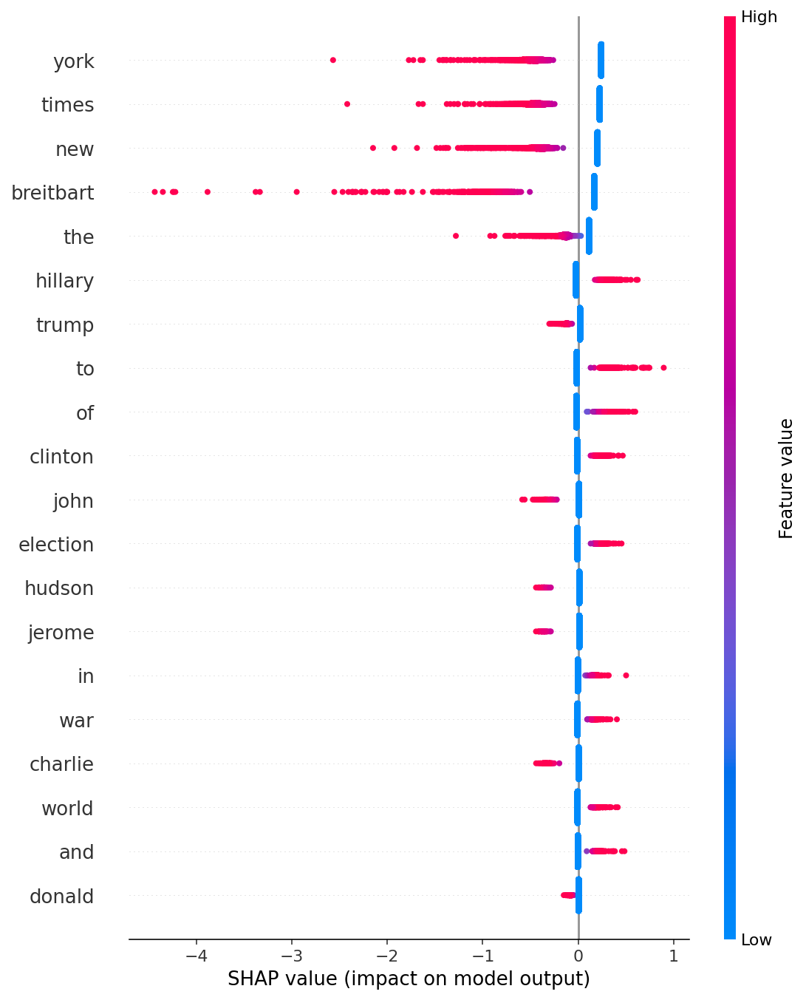

In [ ]:
#shap summary plot

shap.summary_plot(shap_values)

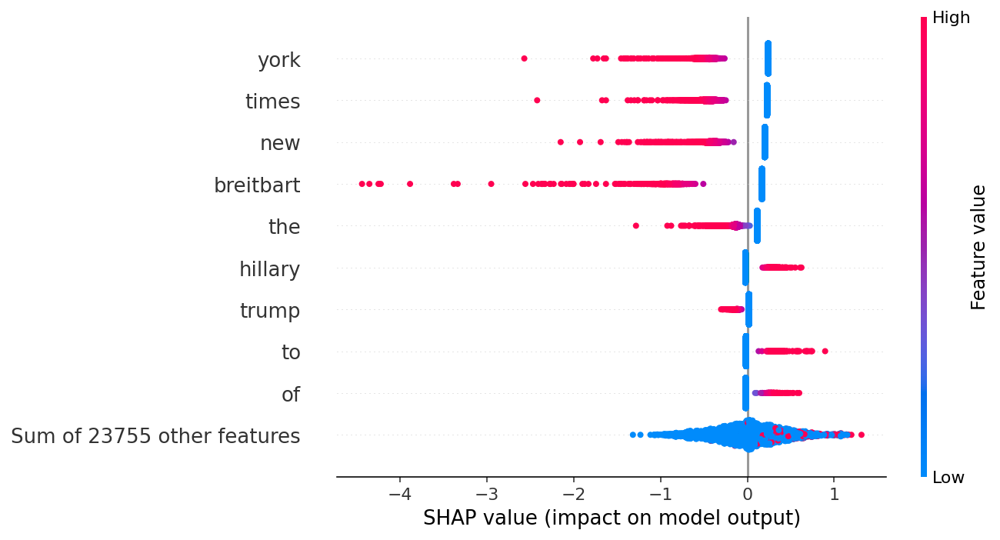

In [ ]:
#shap beeswarm plot

shap.plots.beeswarm(shap_values)#, X_test_array, feature_names=vectorizer.get_feature_names())

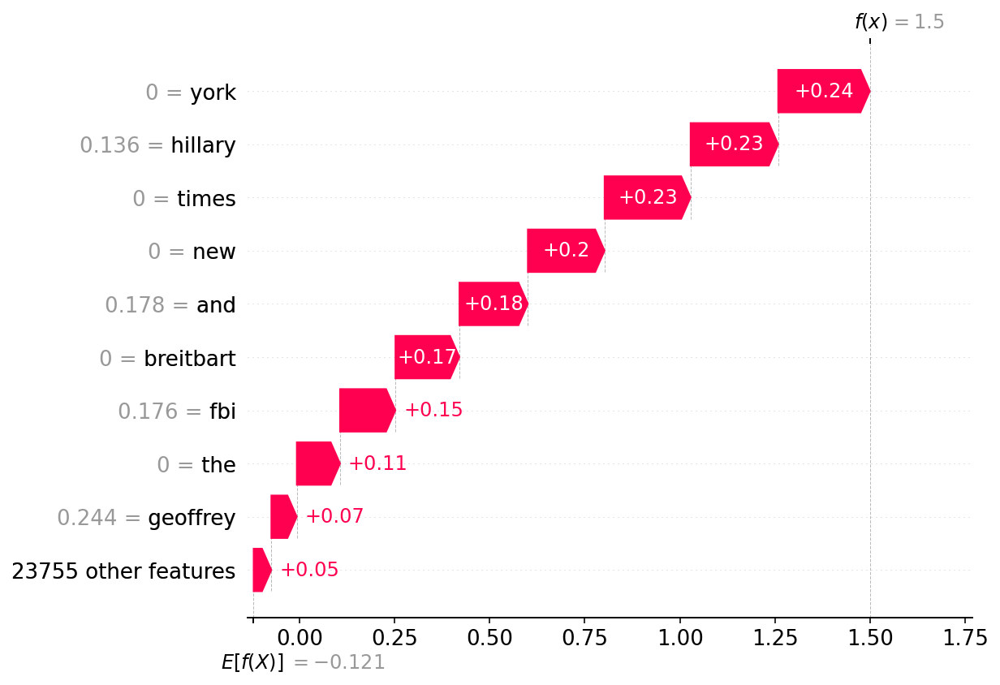

In [ ]:
#shap waterfall plot

shap.plots.waterfall(shap_values[0])

In [ ]:
#importing required libraries

import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, classification_report
from sklearn.metrics import plot_confusion_matrix, plot_precision_recall_curve, plot_roc_curve

[[7310 1000]
 [  60 8270]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

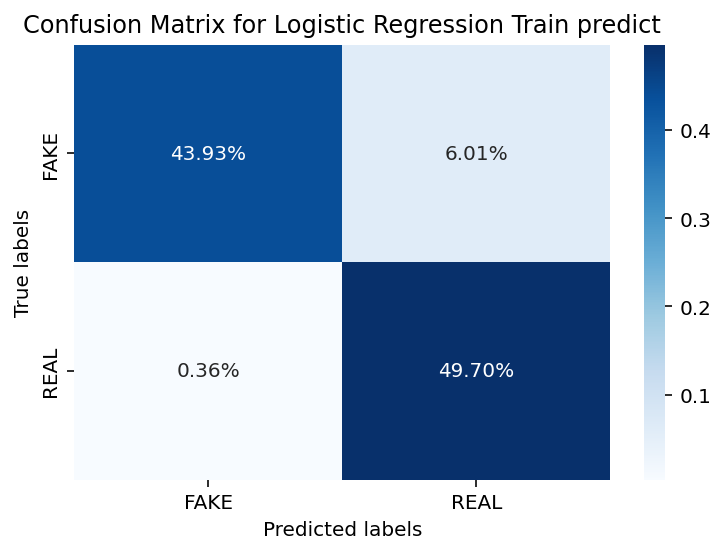

In [ ]:
# Get the confusion matrix for train
labels = ['FAKE', 'REAL']
cm = confusion_matrix(Y_train, train_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Logistic Regression Train predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[1834  243]
 [  22 2061]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

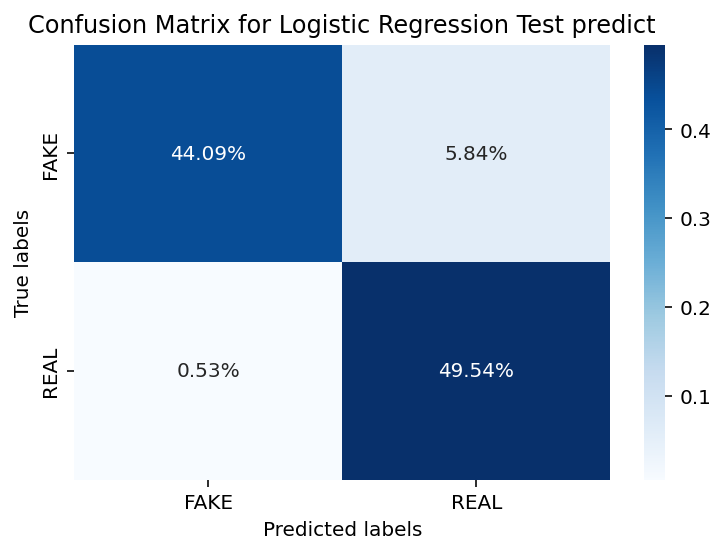

In [ ]:
# Get the confusion matrix for test
labels = ['FAKE', 'REAL']
cm = confusion_matrix(test_Y, test_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Logistic Regression Test predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# print acurracy and roc_auc score
print('ROCAUC score:', roc_auc_score(test_Y, test_preds))
print('Accuracy score:', accuracy_score(test_Y, test_preds))

# Print the classification report for train and test
print(classification_report(Y_train, train_preds))
print("\n")
print(classification_report(test_Y, test_preds))

ROCAUC score: 0.9362213216512331
Accuracy score: 0.9362980769230769
              precision    recall  f1-score   support

           0       0.99      0.88      0.93      8310
           1       0.89      0.99      0.94      8330

    accuracy                           0.94     16640
   macro avg       0.94      0.94      0.94     16640
weighted avg       0.94      0.94      0.94     16640



              precision    recall  f1-score   support

           0       0.99      0.88      0.93      2077
           1       0.89      0.99      0.94      2083

    accuracy                           0.94      4160
   macro avg       0.94      0.94      0.94      4160
weighted avg       0.94      0.94      0.94      4160



**Below are the test accuracies for Logistic regression model**

ROCAUC score: 0.9362213216512331


Accuracy score: 0.9362980769230769

**MultinomialNB Algorithm**

In [ ]:
#importing MNB

from sklearn.naive_bayes import MultinomialNB

#fitting the model to train and test

Multinomial_NB=MultinomialNB()
Multinomial_NB.fit(X_train, Y_train)

MultinomialNB()

In [ ]:
# predict values
train_preds = Multinomial_NB.predict(X_train)
test_preds = Multinomial_NB.predict(X_test)

In [ ]:
# Get the accuracy scores
train_accuracy = accuracy_score(train_preds,Y_train)
test_accuracy = accuracy_score(test_preds,test_Y)

print("The accuracy on train data is ", train_accuracy)
print("The accuracy on test data is ", test_accuracy)

The accuracy on train data is  0.9842548076923077
The accuracy on test data is  0.9545673076923077


[[8297   13]
 [ 249 8081]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

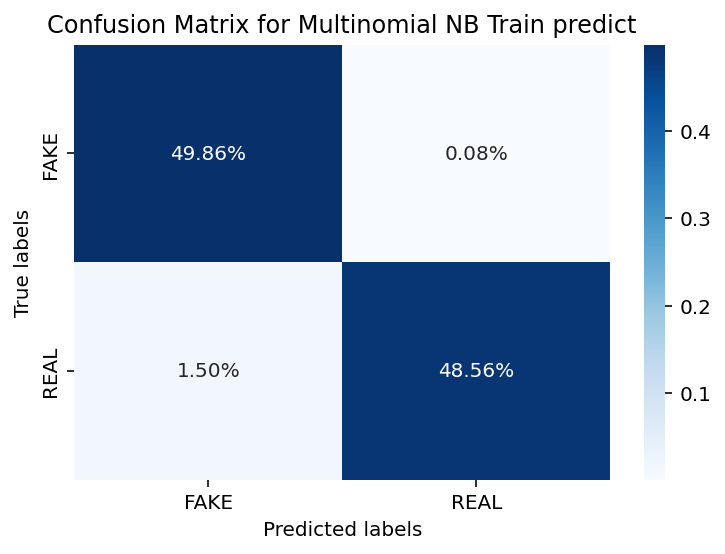

In [ ]:
# Get the confusion matrix for train
labels = ['FAKE', 'REAL']
cm = confusion_matrix(Y_train, train_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Multinomial NB Train predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[2068    9]
 [ 180 1903]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

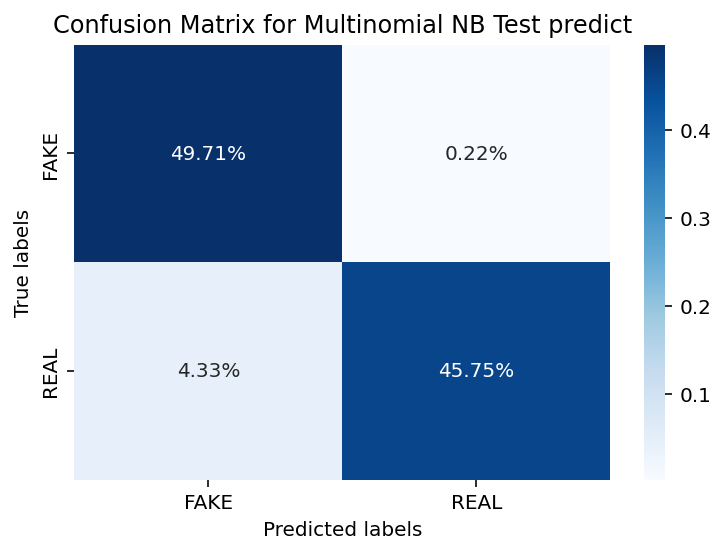

In [ ]:
# Get the confusion matrix for test
labels = ['FAKE', 'REAL']
cm = confusion_matrix(test_Y, test_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Multinomial NB Test predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# print acurracy and roc_auc score
print('ROCAUC score:', roc_auc_score(test_Y, test_preds))
print('Accuracy score:', accuracy_score(test_Y, test_preds))

# Print the classification report for train and test
print(classification_report(Y_train, train_preds))
print("\n")
print(classification_report(test_Y, test_preds))

ROCAUC score: 0.9546265004711779
Accuracy score: 0.9545673076923077
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      8310
           1       1.00      0.97      0.98      8330

    accuracy                           0.98     16640
   macro avg       0.98      0.98      0.98     16640
weighted avg       0.98      0.98      0.98     16640



              precision    recall  f1-score   support

           0       0.92      1.00      0.96      2077
           1       1.00      0.91      0.95      2083

    accuracy                           0.95      4160
   macro avg       0.96      0.95      0.95      4160
weighted avg       0.96      0.95      0.95      4160



**Below are the scores for Multinomial NB**

ROCAUC score: 0.9546265004711779

Accuracy score: 0.9545673076923077

**Support vector machine**

In [ ]:
#importing support vector machine

from sklearn import svm

In [ ]:
#choosing hyperparameters

support_v_m = svm.SVC(kernel = "linear") #SVM Model with default C-value

support_v_m.fit(X_train, Y_train)


SVC(kernel='linear')

In [ ]:
# predict values
train_preds = support_v_m.predict(X_train)
test_preds = support_v_m.predict(X_test)

In [ ]:
# Get the accuracy scores
train_accuracy = accuracy_score(train_preds,Y_train)
test_accuracy = accuracy_score(test_preds,test_Y)

print("The accuracy on train data is ", train_accuracy)
print("The accuracy on test data is ", test_accuracy)

The accuracy on train data is  0.9982572115384616
The accuracy on test data is  0.9939903846153846


[[8296   14]
 [  15 8315]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

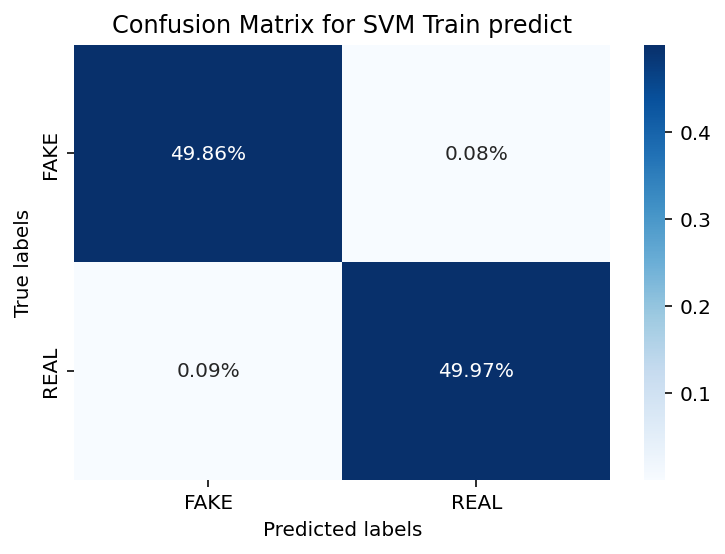

In [ ]:
# Get the confusion matrix for train
labels = ['FAKE', 'REAL']
cm = confusion_matrix(Y_train, train_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for SVM Train predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[2067   10]
 [  15 2068]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

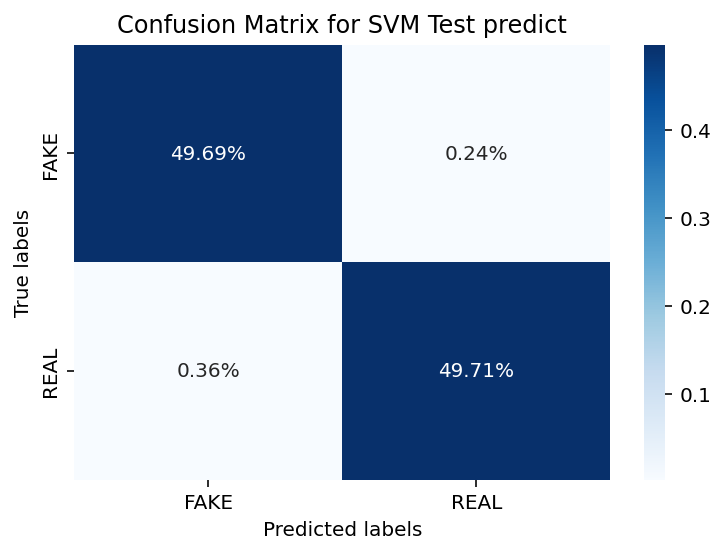

In [ ]:
# Get the confusion matrix for test
labels = ['FAKE', 'REAL']
cm = confusion_matrix(test_Y, test_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for SVM Test predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# print acurracy and roc_auc score
print('ROCAUC score:', roc_auc_score(test_Y, test_preds))
print('Accuracy score:', accuracy_score(test_Y, test_preds))

# Print the classification report for train and test
print(classification_report(Y_train, train_preds))
print("\n")
print(classification_report(test_Y, test_preds))

ROCAUC score: 0.993992105660353
Accuracy score: 0.9939903846153846
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8310
           1       1.00      1.00      1.00      8330

    accuracy                           1.00     16640
   macro avg       1.00      1.00      1.00     16640
weighted avg       1.00      1.00      1.00     16640



              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2077
           1       1.00      0.99      0.99      2083

    accuracy                           0.99      4160
   macro avg       0.99      0.99      0.99      4160
weighted avg       0.99      0.99      0.99      4160



**Below are the aaccuracies for SVM model**

ROCAUC score: 0.993992105660353

Accuracy score: 0.9939903846153846

**Random Forest Classifier**

In [ ]:
#importing RF classifier

from sklearn.ensemble import RandomForestClassifier

In [ ]:
#applying hyperparameters

Random_forest = RandomForestClassifier(n_estimators=30,max_depth=20,random_state=30,min_samples_split=3,criterion='entropy')

In [ ]:
#fitting to x and y train

Random_forest.fit(X_train,Y_train)

RandomForestClassifier(criterion='entropy', max_depth=20, min_samples_split=3,
                       n_estimators=30, random_state=30)

In [ ]:
# Predicted values
train_preds =  Random_forest.predict(X_train)
test_preds  = Random_forest.predict(X_test)

In [ ]:
# Get the accuracy scores
train_accuracy = accuracy_score(train_preds,Y_train)
test_accuracy = accuracy_score(test_preds,test_Y)

print("The accuracy on train data is ", train_accuracy)
print("The accuracy on test data is ", test_accuracy)

The accuracy on train data is  0.9415264423076923
The accuracy on test data is  0.9360576923076923


[[7354  956]
 [  17 8313]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

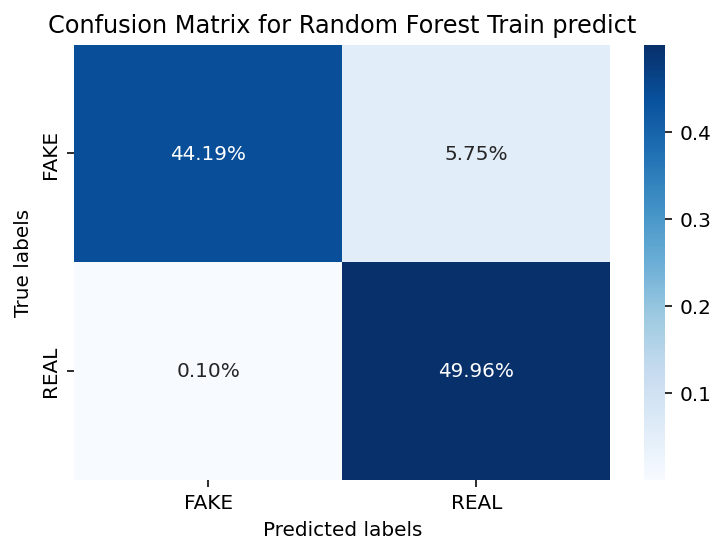

In [ ]:
#the confusion matrix for training
labels = ['FAKE', 'REAL']
cm = confusion_matrix(Y_train, train_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Random Forest Train predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[1819  258]
 [   8 2075]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

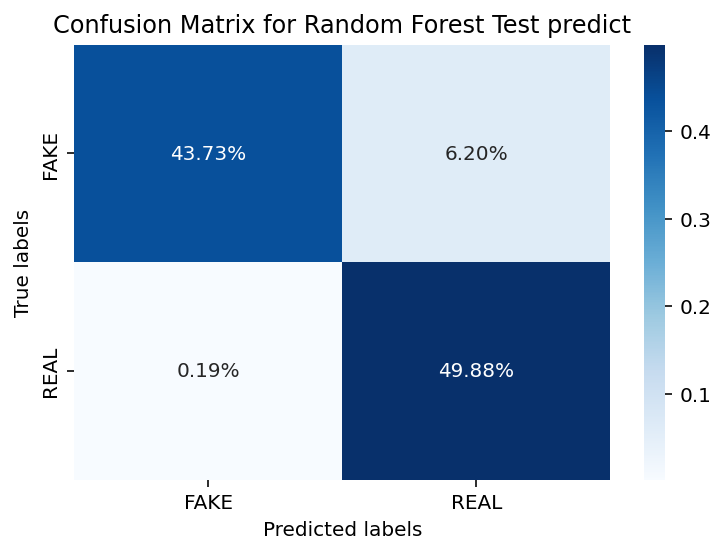

In [ ]:
#the confusion matrix for testing
labels = ['FAKE', 'REAL']
cm = confusion_matrix(test_Y, test_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Random Forest Test predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
#classification report for train
print(classification_report(Y_train, train_preds))

#classification report for train
print(classification_report(test_Y, test_preds))

# print acurracy and roc_auc score
print('ROCAUC score:', roc_auc_score(test_Y, test_preds))
print('Accuracy score:', accuracy_score(test_Y, test_preds))

              precision    recall  f1-score   support

           0       1.00      0.88      0.94      8310
           1       0.90      1.00      0.94      8330

    accuracy                           0.94     16640
   macro avg       0.95      0.94      0.94     16640
weighted avg       0.95      0.94      0.94     16640

              precision    recall  f1-score   support

           0       1.00      0.88      0.93      2077
           1       0.89      1.00      0.94      2083

    accuracy                           0.94      4160
   macro avg       0.94      0.94      0.94      4160
weighted avg       0.94      0.94      0.94      4160

ROCAUC score: 0.9359708819660545
Accuracy score: 0.9360576923076923


**Below are the scores for Random Forest Classifier**

ROCAUC score: 0.9359708819660545

Accuracy score: 0.9360576923076923

**XGBoost classifier**

In [ ]:
#importing xgboost

import xgboost as xgb

In [ ]:
#Using XGBoost Classifier

XGBoost_cla = xgb.XGBClassifier(objective='binary:logistic',colsample_bytree = 0.7, learning_rate = 0.01,
                max_depth = 10, alpha = 10, n_estimators = 10,subsample=1)


In [ ]:
#fitting to x and y test

XGBoost_cla.fit(X_test,test_Y)

XGBClassifier(alpha=10, colsample_bytree=0.7, learning_rate=0.01, max_depth=10,
              n_estimators=10)

In [ ]:
#Predicted values

train_preds = XGBoost_cla.predict(X_train)
test_preds = XGBoost_cla.predict(X_test)

In [ ]:
# Get the accuracy scores
train_accuracy = accuracy_score(train_preds,Y_train)
test_accuracy = accuracy_score(test_preds,test_Y)

print("The accuracy on train data is ", train_accuracy)
print("The accuracy on test data is ", test_accuracy)

The accuracy on train data is  0.946454326923077
The accuracy on test data is  0.953125


[[7456  854]
 [  37 8293]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

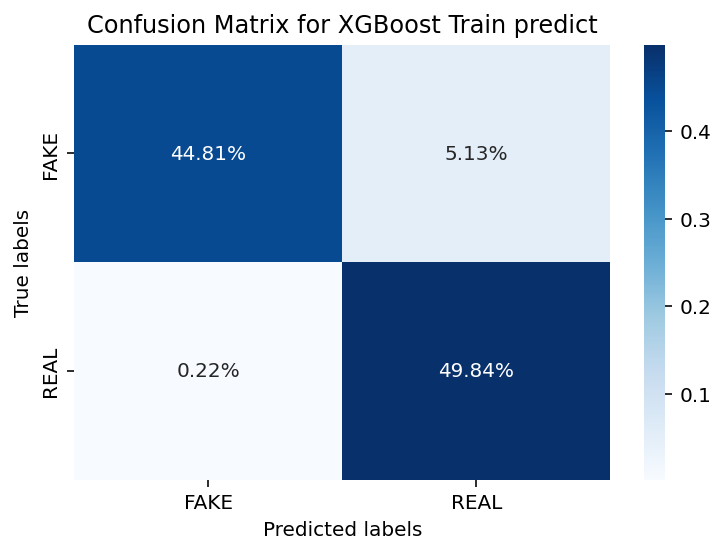

In [ ]:
#The confusion matrix for training
labels = ['FAKE', 'REAL']
cm = confusion_matrix(Y_train, train_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for XGBoost Train predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[1886  191]
 [   4 2079]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

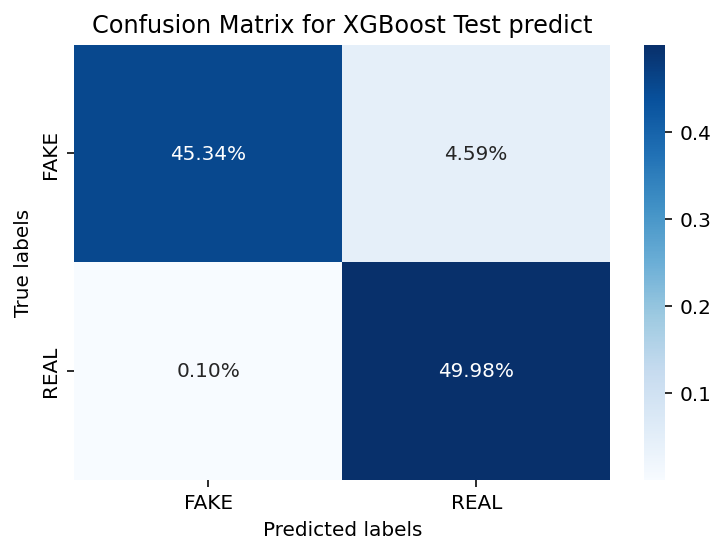

In [ ]:
#The confusion matrix for testing
labels = ['FAKE', 'REAL']
cm = confusion_matrix(test_Y, test_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for XGBoost Test predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# print acurracy and roc_auc score
print('ROCAUC score:', roc_auc_score(test_Y, test_preds))
print('Accuracy score:', accuracy_score(test_Y, test_preds))

# Print the classification report for train and test
print(classification_report(Y_train, train_preds))
print("\n")
print(classification_report(test_Y, test_preds))

ROCAUC score: 0.9530600678486988
Accuracy score: 0.953125
              precision    recall  f1-score   support

           0       1.00      0.90      0.94      8310
           1       0.91      1.00      0.95      8330

    accuracy                           0.95     16640
   macro avg       0.95      0.95      0.95     16640
weighted avg       0.95      0.95      0.95     16640



              precision    recall  f1-score   support

           0       1.00      0.91      0.95      2077
           1       0.92      1.00      0.96      2083

    accuracy                           0.95      4160
   macro avg       0.96      0.95      0.95      4160
weighted avg       0.96      0.95      0.95      4160



**Below are the scores for XGBoost Classifier**

ROCAUC score: 0.9530600678486988

Accuracy score: 0.953125


#**Decision Tree**

In [ ]:
#importing decision tree

from sklearn.tree import DecisionTreeClassifier

In [ ]:
#applying the hyperparameters

Decision_tree = DecisionTreeClassifier(criterion= 'entropy',
                                           max_depth = 20, 
                                           splitter='best', 
                                           random_state=42)
# Fitting the model
Decision_tree.fit(X_train, Y_train)


DecisionTreeClassifier(criterion='entropy', max_depth=20, random_state=42)

In [ ]:
#Predicted values

train_preds = Decision_tree.predict(X_train)
test_preds = Decision_tree.predict(X_test)

In [ ]:
# Get the accuracy scores
train_accuracy = accuracy_score(train_preds,Y_train)
test_accuracy = accuracy_score(test_preds,test_Y)

print("The accuracy on train data is ", train_accuracy)
print("The accuracy on test data is ", test_accuracy)

The accuracy on train data is  0.9755408653846154
The accuracy on test data is  0.9706730769230769


[[7903  407]
 [   0 8330]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

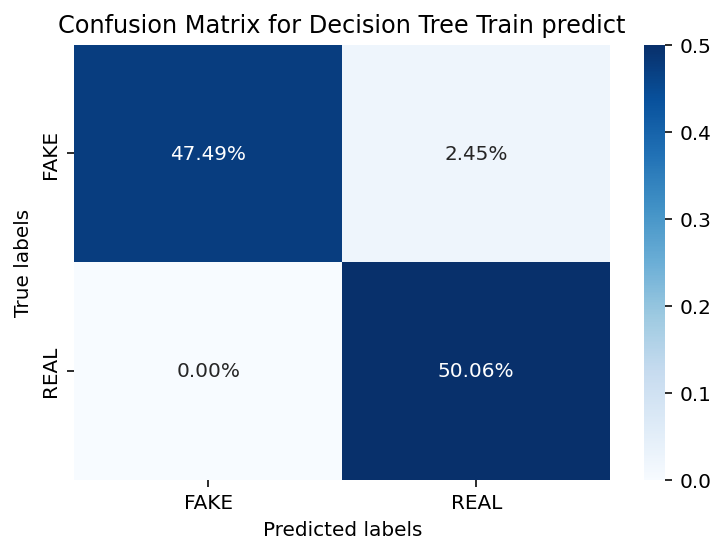

In [ ]:
#The confusion matrix for training
labels = ['FAKE', 'REAL']
cm = confusion_matrix(Y_train, train_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Decision Tree Train predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[1963  114]
 [   8 2075]]


[Text(0, 0.5, 'FAKE'), Text(0, 1.5, 'REAL')]

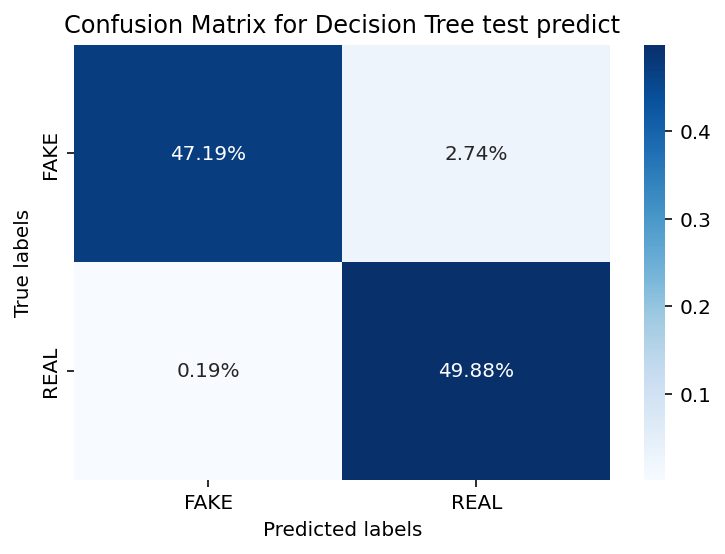

In [ ]:
#The confusion matrix for test
labels = ['FAKE', 'REAL']
cm = confusion_matrix(test_Y, test_preds)
print(cm)
ax= plt.subplot()
ax = sns.heatmap(cm/np.sum(cm), annot=True, #annot=True to annotate cells
            fmt='.2%', cmap='Blues') 
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix for Decision Tree test predict')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# print acurracy and roc_auc score
print('ROCAUC score:', roc_auc_score(test_Y, test_preds))
print('Accuracy score:', accuracy_score(test_Y, test_preds))

# Print the classification report for train and test
print(classification_report(Y_train, train_preds))
print("\n")
print(classification_report(test_Y, test_preds))

ROCAUC score: 0.9706362647296558
Accuracy score: 0.9706730769230769
              precision    recall  f1-score   support

           0       1.00      0.95      0.97      8310
           1       0.95      1.00      0.98      8330

    accuracy                           0.98     16640
   macro avg       0.98      0.98      0.98     16640
weighted avg       0.98      0.98      0.98     16640



              precision    recall  f1-score   support

           0       1.00      0.95      0.97      2077
           1       0.95      1.00      0.97      2083

    accuracy                           0.97      4160
   macro avg       0.97      0.97      0.97      4160
weighted avg       0.97      0.97      0.97      4160



**Saving the required model for error analysis, Logistic regression in this case**

In [ ]:
#importing pickle which will help save the required model

import pickle
# # save the model to disk
filename = 'LogisticReg.sav'
pickle.dump(lr_model, open(filename, 'wb'))


**Loading the saved model**

In [ ]:
#load the model from disk

loaded_model = pickle.load(open(filename, 'rb'))

result = loaded_model.score(X_test, test_Y)
print(result*100)


93.6298076923077


##**ERROR ANALYSIS**##

In [ ]:
#making the split again for the error analysis part

X_train, test_X, Y_train, test_Y = train_test_split(X, Y, test_size = 0.2, stratify=Y, random_state=2)

In [ ]:
#Concatinating test X and Y

full_test=pd.concat([test_X,test_Y],axis=1)

In [ ]:
#checking first two observations

full_test.head(2)

,content,label
20536,Geoffrey Grider Crooked Hillary Risks Having ‘...,1
13735,Richard Sandomir Raymond Smullyan PuzzleCreati...,0


In [ ]:
#resetting the index and dropping the index column

full_test=full_test.reset_index()
full_test=full_test.drop('index',axis=1)

In [ ]:
#checking first five observations

full_test.head()

,content,label
0,Geoffrey Grider Crooked Hillary Risks Having ‘...,1
1,Richard Sandomir Raymond Smullyan PuzzleCreati...,0
2,Staff Writer FEMA ‘Area Emergency Tests’ broad...,1
3,James Delingpole DELINGPOLE ’Penises Cause Cli...,0
4,Deborah Danan Trump Condemns ’Evil Losers’ Beh...,0


In [ ]:
#checking the info of the dataset

full_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4160 entries, 0 to 4159
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   content  4160 non-null   object
 1   label    4160 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 65.1+ KB


In [ ]:
#assigning variables

X_test=full_test[['content']]
Y_test=full_test[['label']]

In [ ]:
#assigning a new variable

predictions =X_test[['content']]

In [ ]:
#applying the vectorizer

X_test = vectorizer.transform(X_test['content'])

In [ ]:
#checking the type

X_test

<4160x23764 sparse matrix of type '<class 'numpy.float64'>'
	with 46541 stored elements in Compressed Sparse Row format>

In [ ]:
#printing the column

predictions

,content
0,Geoffrey Grider Crooked Hillary Risks Having ‘...
1,Richard Sandomir Raymond Smullyan PuzzleCreati...
2,Staff Writer FEMA ‘Area Emergency Tests’ broad...
3,James Delingpole DELINGPOLE ’Penises Cause Cli...
4,Deborah Danan Trump Condemns ’Evil Losers’ Beh...
...,...
4155,Matthew Boyle Teamsters’ Jimmy Hoffa Lavishes ...
4156,ActivistPost 9 Reasons Why I Am NOT Voting
4157,Gillian The Art Jumping Timelines
4158,wmwadmin Furious parent slam ‘damaging’ BBC se...


In [ ]:
predictions['Y_test']=Y_test['label']

In [ ]:
#passing x test to the saved model

pred=loaded_model.predict(X_test)
pred

array([1, 0, 1, ..., 1, 1, 0])

In [ ]:
# assigning var

predictions['pred']=pred

In [ ]:
#checking the predictions for first 25 observations

predictions.head(25)

,content,Y_test,pred
0,Geoffrey Grider Crooked Hillary Risks Having ‘...,1,1
1,Richard Sandomir Raymond Smullyan PuzzleCreati...,0,0
2,Staff Writer FEMA ‘Area Emergency Tests’ broad...,1,1
3,James Delingpole DELINGPOLE ’Penises Cause Cli...,0,0
4,Deborah Danan Trump Condemns ’Evil Losers’ Beh...,0,1
5,Author Politicisation Terrorism BRICS Summit N...,1,1
6,Brian X Chen Farhad Manjoo Vindu Goel Apple De...,0,0
7,Neil W McCabe Capitol Hill Source Intel Chair ...,0,1
8,karencole 4 Natural Tips Make Teeth Sparkling ...,1,1
9,Javi Ramos Ikea crea un carril rápido para sol...,1,1


In [ ]:
#assigning a variable and a code to check for misclassified predictions

misclassified = predictions[predictions['Y_test']!=predictions['pred']]


In [ ]:
#setting option to display 500 rows

pd.set_option('display.max_rows', 500)

In [ ]:
#checking misclassified predictions

misclassified.head(100)

,content,Y_test,pred
4,Deborah Danan Trump Condemns ’Evil Losers’ Beh...,0,1
7,Neil W McCabe Capitol Hill Source Intel Chair ...,0,1
13,John Binder DREAMers Arrested Nationwide Gang ...,0,1
48,Simon Kent ’Drown Your Own Blood Jewish Scum’ ...,0,1
54,Ezra Dulis Jake Tapper’s Dream Interview Is Dr...,0,1
60,Michelle Moons Pulse Massacre Jihadi’s Wife Ar...,0,1
95,Aaron Klein Guardian Opinion Writer Trump Bann...,0,1
100,Bob Price Video Shows Texas Dem Encouraging ’S...,0,1
110,Cartel Chronicles Highway Horror Mexican Carte...,0,1
125,Eric Striker “Chapo Trap House” New LeftWing P...,1,0


In [ ]:
#information of misclassified predictions

misclassified.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 265 entries, 4 to 4132
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   content  265 non-null    object
 1   Y_test   265 non-null    int64 
 2   pred     265 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 8.3+ KB


## Predictive system

In [ ]:
#code to build a short predictive system

X_new = X_test[1]

prediction = lr_model.predict(X_new)
print(prediction)

if (prediction[0]==0):
  print('The news is True')
else:
  print('The news is Fake')

[0]
The news is Real


##**SHAP**

## SHAP Analysis for 'True' predictions

In [ ]:
#importing shap

import shap
shap.initjs()

**Shap analysis for documnet "1"**

In [ ]:
#printing the conent with location 1

print(predictions['content'][1])

Richard Sandomir Raymond Smullyan PuzzleCreating Logician Dies 97 The New York Times


In [ ]:
#printing the conent with location 1

print(predictions.loc[1])

content    Richard Sandomir Raymond Smullyan PuzzleCreati...
Y_test                                                     0
pred                                                       0
Name: 1, dtype: object


In [ ]:
#getting the shap values and force plot for index location 1

shap.initjs()
ind = 1
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "3"**

In [ ]:
#printing the conent for location 3

print(predictions['content'][3])

James Delingpole DELINGPOLE ’Penises Cause Climate Change’ Progressives Fooled PeerReviewed Hoax Study Breitbart


In [ ]:
#printing the conent for location 1

print(predictions.loc[3])

content    James Delingpole DELINGPOLE ’Penises Cause Cli...
Y_test                                                     0
pred                                                       0
Name: 3, dtype: object


In [ ]:
#getting the shap values and force plot for index location 3

shap.initjs()
ind = 3
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "6"**

In [ ]:
#printing the conent for location 6

print(predictions['content'][6])

Brian X Chen Farhad Manjoo Vindu Goel Apple Developer Conference A More Open Siri Other Upgrades The New York Times


In [ ]:
#printing the conent for location 6

print(predictions.loc[6])

content    Brian X Chen Farhad Manjoo Vindu Goel Apple De...
Y_test                                                     0
pred                                                       0
Name: 6, dtype: object


In [ ]:
#getting the shap values and force plot for index location 6

shap.initjs()
ind = 6
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "10"**

In [ ]:
#printing the conent for location 10

print(predictions['content'][10])

John Herrman Social Media Finds New Role News Entertainment Curator The New York Times


In [ ]:
#printing the conent for location 10

print(predictions.loc[10])

content    John Herrman Social Media Finds New Role News ...
Y_test                                                     0
pred                                                       0
Name: 10, dtype: object


In [ ]:
#getting the shap values and force plot for index location 10

shap.initjs()
ind = 10
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "15"**

In [ ]:
#printing the conent for location 15

print(predictions['content'][15])

Breitbart Jerusalem Israeli Minister Miri Regev ‘Thank God’ Obama Is Leaving Office


In [ ]:
#printing the conent for location 15

print(predictions.loc[15])

content    Breitbart Jerusalem Israeli Minister Miri Rege...
Y_test                                                     0
pred                                                       0
Name: 15, dtype: object


In [ ]:
#getting the shap values and force plot for index location 15

shap.initjs()
ind = 15
shap.plots.force(shap_values[ind])

#SHAP Analysis for 'Fake' predictions

**Shap analysis for documnet "0"**

In [ ]:
#printing the content for location 0

print(predictions['content'][0])

Geoffrey Grider Crooked Hillary Risks Having ‘Blue Dress Moment’ By Aggressively Attacking FBI And James Comey


In [ ]:
#printing the content for location 0

print(predictions.loc[0])

content    Geoffrey Grider Crooked Hillary Risks Having ‘...
Y_test                                                     1
pred                                                       1
Name: 0, dtype: object


In [ ]:
#getting the shap values and force plot for index location 0

shap.initjs()
ind = 0
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "2"**

In [ ]:
#printing the content for location 2

print(predictions['content'][2])

Staff Writer FEMA ‘Area Emergency Tests’ broadcast election


In [ ]:
#printing the content for location 2

print(predictions.loc[2])

content    Staff Writer FEMA ‘Area Emergency Tests’ broad...
Y_test                                                     1
pred                                                       1
Name: 2, dtype: object


In [ ]:
#getting the shap values and force plot for index location 2

shap.initjs()
ind = 2
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "5"**

In [ ]:
#printing the content for location 5

print(predictions['content'][5])

Author Politicisation Terrorism BRICS Summit New Eastern Outlook


In [ ]:
#printing the content for location 5

print(predictions.loc[5])

content    Author Politicisation Terrorism BRICS Summit N...
Y_test                                                     1
pred                                                       1
Name: 5, dtype: object


In [ ]:
#getting the shap values and force plot for index location 5

shap.initjs()
ind = 5
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "11"**

In [ ]:
#printing the content for location 11

print(predictions['content'][11])

para kazanmak Comment Facebook Daughter’s Day Hoax Is A Sign Of The Times para kazanmak


In [ ]:
#printing the content for location 11

print(predictions.loc[11])

content    para kazanmak Comment Facebook Daughter’s Day ...
Y_test                                                     1
pred                                                       1
Name: 11, dtype: object


In [ ]:
#getting the shap values and force plot for index location 11

shap.initjs()
ind = 11
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "16"**

In [ ]:
#printing the content for location 16

print(predictions['content'][16])

Witness identifies one key suspect buyer car used spy murdered Nemtsov Russia News Now


In [ ]:
#printing the content for location 16

print(predictions.loc[16])

content    Witness identifies one key suspect buyer car u...
Y_test                                                     1
pred                                                       1
Name: 16, dtype: object


In [ ]:
#getting the shap values and force plot for index location 16

shap.initjs()
ind = 16
shap.plots.force(shap_values[ind])

#SHAP Analysis for 'Misclassified' predictions

**Shap analysis for documnet "4"**

In [ ]:
#printing the content for location 4

print(predictions['content'][4])

Deborah Danan Trump Condemns ’Evil Losers’ Behind Manchester Concert Massacre


In [ ]:
#printing the content for location 4

print(predictions.loc[4])

content    Deborah Danan Trump Condemns ’Evil Losers’ Beh...
Y_test                                                     0
pred                                                       1
Name: 4, dtype: object


In [ ]:
#getting the shap values and force plot for index location 4

shap.initjs()
ind = 4
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "7"**

In [ ]:
#printing the content for location 7

print(predictions['content'][7])

Neil W McCabe Capitol Hill Source Intel Chair Nunes Temporarily Vacated Russia Probe Keep Focus Russia


In [ ]:
#printing the content for location 7

print(predictions.loc[7])

content    Neil W McCabe Capitol Hill Source Intel Chair ...
Y_test                                                     0
pred                                                       1
Name: 7, dtype: object


In [ ]:
#getting the shap values and force plot for index location 7

shap.initjs()
ind = 7
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "48"**

In [ ]:
#printing the content for location 48

print(predictions['content'][48])

Simon Kent ’Drown Your Own Blood Jewish Scum’ Vile Death Threat After Gym Owner Slams IS Militants


In [ ]:
#printing the content for location 48

print(predictions.loc[48])

content    Simon Kent ’Drown Your Own Blood Jewish Scum’ ...
Y_test                                                     0
pred                                                       1
Name: 48, dtype: object


In [ ]:
#getting the shap values and force plot for index location 48

shap.initjs()
ind = 48
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "54"**

In [ ]:
#printing the content for location 54

print(predictions['content'][54])

Ezra Dulis Jake Tapper’s Dream Interview Is Drugged Vladimir Putin


In [ ]:
#printing the content for location 54

print(predictions.loc[54])

content    Ezra Dulis Jake Tapper’s Dream Interview Is Dr...
Y_test                                                     0
pred                                                       1
Name: 54, dtype: object


In [ ]:
#getting the shap values and force plot for index location 54

shap.initjs()
ind = 54
shap.plots.force(shap_values[ind])

**Shap analysis for documnet "60"**

In [ ]:
#printing the content for location 60

print(predictions['content'][60])

Michelle Moons Pulse Massacre Jihadi’s Wife Arrested


In [ ]:
#printing the content for location 60

print(predictions.loc[60])

content    Michelle Moons Pulse Massacre Jihadi’s Wife Ar...
Y_test                                                     0
pred                                                       1
Name: 60, dtype: object


In [ ]:
#getting the shap values and force plot for index location 60

shap.initjs()
ind = 60
shap.plots.force(shap_values[ind])

##**END**